<a href="https://colab.research.google.com/github/Sadie-Zhao/-Generative-Adversarial-Inverse-Multiagent-Learning-ICLR2024/blob/main/Electricity_Markets.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Electricity market experiment

## Data

In [ ]:
df_weather = pd.read_csv(
    './data/weather_features.csv',
    parse_dates=['dt_iso']
)

df_energy = pd.read_csv(
    './data/energy_dataset.csv',
    parse_dates=['time']
)

### First organize price and demand data.

We will drop all the columns that are constituted by zeroes and NaNs, as they are unusable. We will also remove the columns which will not be used at all in our analysis and which contain day-ahead forecasts for the total load, the solar energy and the wind energy.

In [ ]:
# Drop unusable columns

df_energy = df_energy.drop(['generation fossil coal-derived gas','generation fossil oil shale',
                            'generation fossil peat', 'generation geothermal',
                            'generation hydro pumped storage aggregated', 'generation marine',
                            'generation wind offshore', 'forecast wind offshore eday ahead',
                            'total load forecast', 'forecast solar day ahead',
                            'forecast wind onshore day ahead'],
                            axis=1)

The 'time' column, which we also want to function as the index of the observations in a time-series, has not been parsed correctly and is recognized as an object.

In [ ]:
df_energy['time'] = pd.to_datetime(df_energy['time'], utc=True, infer_datetime_format=True)
df_energy = df_energy.set_index('time')

/var/folders/hv/bq6w0jln7px_hm6skwv71qfh0000gn/T/ipykernel_35611/3290006887.py:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df_energy['time'] = pd.to_datetime(df_energy['time'], utc=True, infer_datetime_format=True)


The null values in 'actual total load' also coincide with the aforementioned columns, but also appear in other rows as well. In order to handle the null values in `df_energy`, we will use a linear interpolation with a forward direction. Perhaps other kinds of interpolation would be better; nevertheless, we prefer to use the simplest model possible. Only a small part of our input data will be noisy and it will not affect performance noticeably.

In [ ]:
# Fill null values using interpolation
df_energy.interpolate(method='linear', limit_direction='forward', inplace=True, axis=0)

### Organize Weather Data

We have to change the type of some of the columns, so that all of them are float64. We also have to parse 'dt_iso' correctly and actually rename it as 'time' so that it matches with the index of `df_energy`.

In [ ]:
def df_convert_dtypes(df, convert_from, convert_to):
    cols = df.select_dtypes(include=[convert_from]).columns
    for col in cols:
        df[col] = df[col].values.astype(convert_to)
    return df

In [ ]:
# Convert columns with int64 type values to float64 type

df_weather = df_convert_dtypes(df_weather, np.int64, np.float64)

In [ ]:
# Convert dt_iso to datetime type, rename it and set it as index

df_weather['time'] = pd.to_datetime(df_weather['dt_iso'], utc=True, infer_datetime_format=True)
df_weather = df_weather.drop(['dt_iso'], axis=1)
df_weather = df_weather.set_index('time')

/var/folders/hv/bq6w0jln7px_hm6skwv71qfh0000gn/T/ipykernel_35611/2189753010.py:3: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df_weather['time'] = pd.to_datetime(df_weather['dt_iso'], utc=True, infer_datetime_format=True)


We have to **split** the `df_weather` dataset into 5 datasets, **one for each different city** (Madrid, Barcelona, Bilbao, Seville and Valencia). But first, let's see the average values for each column, grouped by each city (note that the 'weather_id' average has no meaning whatsoever).

In [ ]:
df_weather.groupby('city_name').head()

,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
time,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,Valencia,270.475000,270.475000,270.475000,1001.0,77.0,1.0,62.0,0.0,0.0,0.0,0.0,800.0,clear,sky is clear,01n
2015-01-01 00:00:00+00:00,Valencia,270.475000,270.475000,270.475000,1001.0,77.0,1.0,62.0,0.0,0.0,0.0,0.0,800.0,clear,sky is clear,01n
2015-01-01 01:00:00+00:00,Valencia,269.686000,269.686000,269.686000,1002.0,78.0,0.0,23.0,0.0,0.0,0.0,0.0,800.0,clear,sky is clear,01n
2015-01-01 02:00:00+00:00,Valencia,269.686000,269.686000,269.686000,1002.0,78.0,0.0,23.0,0.0,0.0,0.0,0.0,800.0,clear,sky is clear,01n
2015-01-01 03:00:00+00:00,Valencia,269.686000,269.686000,269.686000,1002.0,78.0,0.0,23.0,0.0,0.0,0.0,0.0,800.0,clear,sky is clear,01n
2014-12-31 23:00:00+00:00,Madrid,267.325000,267.325000,267.325000,971.0,63.0,1.0,309.0,0.0,0.0,0.0,0.0,800.0,clear,sky is clear,01n
2015-01-01 00:00:00+00:00,Madrid,267.325000,267.325000,267.325000,971.0,63.0,1.0,309.0,0.0,0.0,0.0,0.0,800.0,clear,sky is clear,01n
2015-01-01 01:00:00+00:00,Madrid,266.186000,266.186000,266.186000,971.0,64.0,1.0,273.0,0.0,0.0,0.0,0.0,800.0,clear,sky is clear,01n
2015-01-01 02:00:00+00:00,Madrid,266.186000,266.186000,266.186000,971.0,64.0,1.0,273.0,0.0,0.0,0.0,0.0,800.0,clear,sky is clear,01n


In [ ]:
# Display average weather features grouped by each city

mean_weather_by_city = df_weather.groupby('city_name').mean(numeric_only=True)
mean_weather_by_city

,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id
city_name,,,,,,,,,,,,
Barcelona,289.848248,288.594704,291.021987,1284.010486,73.994221,2.786588,187.188043,0.117079,0.000327,0.000000,23.229648,760.917465
Bilbao,286.378489,284.916661,288.036687,1017.567439,79.089455,1.957470,159.883536,0.123493,0.001034,0.023455,43.960697,723.943228
Madrid,288.061071,286.824877,289.155600,1011.838448,59.776932,2.441696,173.293159,0.055083,0.000129,0.000029,22.397028,762.260264
Seville,293.105431,291.184103,295.962431,1018.504711,64.140732,2.483787,151.757179,0.045392,0.000180,0.000000,14.748770,771.409849
Valencia,290.780780,290.222277,291.355025,1015.973794,65.145113,2.692815,160.753820,0.035924,0.000226,0.000154,20.820999,781.228283


In [ ]:
# Drop columns with qualitative weather information
df_weather = df_weather.drop(['weather_main', 'weather_id',
                              'weather_description', 'weather_icon'], axis=1)

In [ ]:
# Replace outliers in 'pressure' with NaNs

df_weather.loc[df_weather.pressure > 1051, 'pressure'] = np.nan
df_weather.loc[df_weather.pressure < 931, 'pressure'] = np.nan

In [ ]:
# Replace outliers in 'wind_speed' with NaNs

df_weather.loc[df_weather.wind_speed > 50, 'wind_speed'] = np.nan

In [ ]:
# Fill null values using interpolation

df_weather.interpolate(method='linear', limit_direction='forward', inplace=True, axis=0)

### Merging the datasets

In [ ]:
# Split the df_weather into 5 dataframes (one for each city)

df_1, df_2, df_3, df_4, df_5 = [x for _, x in df_weather.groupby('city_name')]
dfs = [df_1, df_2, df_3, df_4, df_5]

In [ ]:
# Merge all dataframes into the final dataframe

df_final = df_energy

for df in dfs:
    city = df['city_name'].unique()
    city_str = str(city).replace("'", "").replace('[', '').replace(']', '').replace(' ', '')
    df = df.add_suffix('_{}'.format(city_str))
    df_final = df_final.merge(df, on=['time'], how='outer')
    df_final = df_final.drop('city_name_{}'.format(city_str), axis=1)

df_final.columns


Index(['generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil gas', 'generation fossil hard coal',
       'generation fossil oil', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation nuclear',
       'generation other', 'generation other renewable', 'generation solar',
       'generation waste', 'generation wind onshore', 'total load actual',
       'price day ahead', 'price actual', 'temp_Barcelona',
       'temp_min_Barcelona', 'temp_max_Barcelona', 'pressure_Barcelona',
       'humidity_Barcelona', 'wind_speed_Barcelona', 'wind_deg_Barcelona',
       'rain_1h_Barcelona', 'rain_3h_Barcelona', 'snow_3h_Barcelona',
       'clouds_all_Barcelona', 'temp_Bilbao', 'temp_min_Bilbao',
       'temp_max_Bilbao', 'pressure_Bilbao', 'humidity_Bilbao',
       'wind_speed_Bilbao', 'wind_deg_Bilbao', 'rain_1h_Bilbao',
       'rain_3h_Bilbao', 'snow_3h_Bilbao', 'clo

### Additional Data triaging

In [ ]:
cities = ['Barcelona', 'Bilbao', 'Madrid', 'Seville', 'Valencia']

for city in cities:
    df_final = df_final.drop(f'rain_3h_{city}', axis=1)

From the above, we can already see some very interesting correlations among the energy price that we want to predict and the rest of the features. For example, the total energy load and the amount of energy generated from sources related to fossil fuels, is positively correlated with the electricity price. In contrast, the wind speed in almost every city and the amount of storage energy cosumed through hydroelectric pumping is negatively correlated with the energy price. We will go ahead and drop the 'snow_3h_Barcelona' and 'snow_3h_Seville' which give NaNs in their correlations with the electricity actual price.

In [ ]:
df_final = df_final.drop(['snow_3h_Barcelona', 'snow_3h_Seville'], axis=1)

### Feature Engineering/Generation

The first features that we will generate for a given hour will just be that particular hour, the day and the month in which it falls into.

In [ ]:
# Generate 'hour', 'weekday' and 'month' features

for i in range(len(df_final)):
    position = df_final.index[i]
    hour = position.hour
    weekday = position.weekday()
    month = position.month
    df_final.loc[position, 'hour'] = hour
    df_final.loc[position, 'weekday'] = weekday
    df_final.loc[position, 'month'] = month

A very useful feature that we will generate, has to do with the business hours, i.e. whether businesses are open or not in a given hour. However, there is a certain peculiarity in Spain as the 9AM-5PM working day is not generally followed by all types of businesses, due to a lunch break (known as "siesta") in between. The most usual business hours are from Monday-Saturday, from 9:30AM-1:30PM and then again from 4:30PM-8PM.

Therefore, the value of the 'business hour' will be equal to '2' if the given hour is within the business hours, equal to '1' if the given hour is within the "siesta" in between and equal to '0' for all other given hours.

In [ ]:
# Generate 'business hour' feature
for i in range(len(df_final)):
    position = df_final.index[i]
    hour = position.hour
    if ((hour > 8 and hour < 14) or (hour > 16 and hour < 21)):
        df_final.loc[position, 'business hour'] = 2
    elif (hour >= 14 and hour <= 16):
        df_final.loc[position, 'business hour'] = 1
    else:
        df_final.loc[position, 'business hour'] = 0

However, we have generated the 'business hour' feature in such a way which also includes weekends, on which fewer -or different types of- businesses are open. Thus, it is useful to also generate another feature, 'weekend', which will distuingish weekdays and weekends, as well as make a distinction between Saturdays and Sundays.

In particular, for a particular given hour, the value of 'weekend' will be equal to '0', if the hours is in a weekday, equal to '1' if the hour is in a Saturday and equal to '2' if the hour is in a Sunday.

In [ ]:
# Generate 'weekend' feature

for i in range(len(df_final)):
    position = df_final.index[i]
    weekday = position.weekday()
    if (weekday == 6):
        df_final.loc[position, 'weekday'] = 2
    elif (weekday == 5):
        df_final.loc[position, 'weekday'] = 1
    else:
        df_final.loc[position, 'weekday'] = 0

In order to reduce the dimensionality and potentially acquire a new kind of information, for every given hour, we will subtract the minimum temperature ('temp_min') from the maximum temperature ('temp_max') for each city and we will name that feature 'temp_range_{name of city}'.

In [ ]:
# Generate 'temp_range' for each city

cities = ['Barcelona', 'Bilbao', 'Madrid', 'Seville', 'Valencia']

for i in range(len(df_final)):
    position = df_final.index[i]
    for city in cities:
        temp_max = df_final.loc[position, 'temp_max_{}'.format(city)]
        temp_min = df_final.loc[position, 'temp_min_{}'.format(city)]
        df_final.loc[position, 'temp_range_{}'.format(city)] = abs(temp_max - temp_min)

After seeing that there is a high correlation among the temperatures of the different cities, we will also try creating a weighted temperature features by taking into account each city's population [[7]](#ref40).

- Madrid: 6,155,116
- Barcelona: 5,179,243
- Valencia: 1,645,342
- Seville: 1,305,342
- Bilbao: 987,000

In [ ]:
# Calculate the weight of every city
total_pop = 6155116 + 5179243 + 1645342 + 1305342 + 987000

weight_Madrid = 6155116 / total_pop
weight_Barcelona = 5179243 / total_pop
weight_Valencia = 1645342 / total_pop
weight_Seville = 1305342 / total_pop
weight_Bilbao = 987000 / total_pop

In [ ]:
cities_weights = {'Madrid': weight_Madrid,
                  'Barcelona': weight_Barcelona,
                  'Valencia': weight_Valencia,
                  'Seville': weight_Seville,
                  'Bilbao': weight_Bilbao}

In [ ]:
# Generate 'temp_weighted' feature
for i in range(len(df_final)):
    position = df_final.index[i]
    temp_weighted = 0
    for city in cities:
        temp = df_final.loc[position, 'temp_{}'.format(city)]
        temp_weighted += temp * cities_weights.get('{}'.format(city))
    df_final.loc[position, 'temp_weighted'] = temp_weighted

We will also generate a new feature which aggregates both energy sources which are related to coal and are highly correlated (0.7688).

In [ ]:
df_final['generation coal all'] = df_final['generation fossil hard coal'] + df_final['generation fossil brown coal/lignite']

In [ ]:
# Define the file path
file_path = "data/df_final_norm.csv"

# Check if the file exists
if os.path.isfile(file_path):
    # Load the file
    df_final_norm = pd.read_csv(file_path, index_col=0)
else:
    # Normalize
    df_final_norm = (df_final - df_final.min()) / (df_final.max() - df_final.min())
    # Save the file
    df_final_norm.to_csv(file_path)

# Display the first 5 rows of the dataframe
df_final_norm.head()
df_final_norm.columns

Index(['generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil gas', 'generation fossil hard coal',
       'generation fossil oil', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation nuclear',
       'generation other', 'generation other renewable', 'generation solar',
       'generation waste', 'generation wind onshore', 'total load actual',
       'price day ahead', 'price actual', 'temp_Barcelona',
       'temp_min_Barcelona', 'temp_max_Barcelona', 'pressure_Barcelona',
       'humidity_Barcelona', 'wind_speed_Barcelona', 'wind_deg_Barcelona',
       'rain_1h_Barcelona', 'clouds_all_Barcelona', 'temp_Bilbao',
       'temp_min_Bilbao', 'temp_max_Bilbao', 'pressure_Bilbao',
       'humidity_Bilbao', 'wind_speed_Bilbao', 'wind_deg_Bilbao',
       'rain_1h_Bilbao', 'snow_3h_Bilbao', 'clouds_all_Bilbao', 'temp_Madrid',
       'temp_min_Madrid', 'temp_max

## Estimate Model

In [ ]:

# Split the data into train, validation, and test sets
# Train data is two years, validation data is one year, test data is one year

train_size = 18615
val_size = 9731
test_size = len(df_final_norm) - train_size - val_size

df_train = df_final_norm[1:train_size]
df_val = df_final_norm[train_size:train_size+val_size]
df_train_val = df_final_norm[1:train_size+val_size]
df_test = df_final_norm[train_size+val_size:]
df_val_test = df_final_norm[train_size:]

In [ ]:
aggr_demand_train = df_train['total load actual'].values
aggr_demand_train_val = df_train_val['total load actual'].values
aggr_demand_val = df_val['total load actual'].values
aggr_demand_test = df_test['total load actual'].values
aggr_demand_val_test = df_val_test['total load actual'].values

prices_train = df_train[['price actual', 'price day ahead']].values
prices_train_val = df_train_val[['price actual', 'price day ahead']].values
prices_val = df_val[['price actual', 'price day ahead']].values
prices_test = df_test[['price actual', 'price day ahead']].values
prices_val_test = df_val_test[['price actual', 'price day ahead']].values

aggr_demand_hist = (aggr_demand_train, aggr_demand_val, aggr_demand_test)

prices_hist = (prices_train, prices_val, prices_test)

world_states = jnp.array(df_final_norm[1:].drop(['total load actual', 'price actual', 'price day ahead'], axis=1).values)

world_states_train = df_train.drop(['total load actual', 'price actual', 'price day ahead'], axis=1).values
world_states_train_val = df_train_val.drop(['total load actual', 'price actual', 'price day ahead'], axis=1).values
world_states_val = df_val.drop(['total load actual', 'price actual', 'price day ahead'], axis=1).values
world_states_test = df_test.drop(['total load actual', 'price actual', 'price day ahead'], axis=1).values
world_states_val_test = df_val_test.drop(['total load actual', 'price actual', 'price day ahead'], axis=1).values

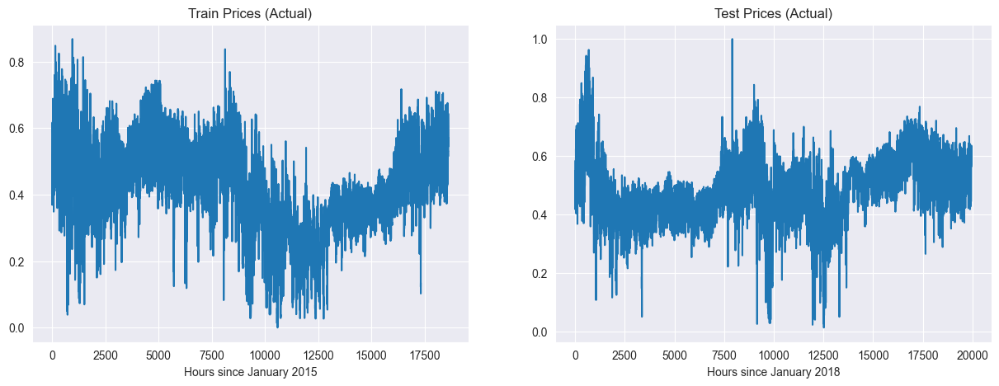

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

axs[0].plot(prices_train[:, 0])
axs[0].set_title('Train Prices (Actual)')
axs[0].set_xlabel('Hours since January 2015')

# axs[1].plot(prices_val[:, 0])
# axs[1].set_title('Validation Prices (Actual)')

axs[1].plot(prices_val_test[:, 0])
axs[1].set_title('Test Prices (Actual)')
axs[1].set_xlabel('Hours since January 2018')

plt.show()


In [ ]:
def plot_price_prediction(l_action, f_action):
    market_actor_network = hk.without_apply_rng(hk.transform(_market_actor_forward))

    price_policy = lambda state: market_actor_network.apply(f_action, state)[0]
    buyer_policy = lambda state: market_actor_network.apply(f_action, state)[1]

    price_history = df_final_norm[['price actual']].values[1:]

    traj = market.trajectory(l_action, price_policy, buyer_policy, price_history.shape[0])

    f_prices_hist = traj.a
    f_alloc_hist = traj.b[0]
    f_saving_hist = traj.b[1]

    val_start = prices_train.shape[0]
    test_start = prices_train.shape[0] + prices_val.shape[0]

    plt.plot(price_history)
    plt.plot(f_prices_hist)
    plt.axvline(x=val_start, color='r', linestyle='--')
    plt.axvline(x=test_start, color='g', linestyle='--')
    plt.show()


def estimate_market_params(aggr_demand_hist, prices_hist, learn_rates, num_iters, beta_mult, beta, num_buyers, num_goods, num_episodes, num_br_epochs, util_type = "linear", opt_name = "adam"):
    #Initialize PRNG keys
    prng_keys = hk.PRNGSequence(seed)

    # Initialize market type
    if util_type == "linear":
        utils = lambda X, T: jnp.sum(T * X, axis = 1).clip(1e-5)
    elif util_type == "cd":
        utils = lambda X, T: jnp.prod(jnp.power(X, T), axis = 1).clip(1e-5)
    elif util_type == "leontief":
        utils = lambda X, T: jnp.min(X / T, axis = 1).clip(1e-5)
    else:
        raise ValueError("Invalid utility function!")

    utils = jax.jit(utils)

    br_network = hk.without_apply_rng(hk.transform(_br_network))
    market_actor_network = hk.without_apply_rng(hk.transform(_market_actor_forward))

    market = sf.StochasticFisher(utils, market_actor_network, br_network, seed)

    aggr_demand_train, aggr_demand_val, aggr_demand_test = aggr_demand_hist
    prices_train, prices_val, prices_test = prices_hist

    total_episodes = prices_train.shape[0] + prices_val.shape[0] + prices_test.shape[0]

    # Initialize learning rates
    learn_rate_players, learn_rate_langmult, learn_rate_br = learn_rates



    ####### Initalize market parameters #######
    supplies = jax.random.uniform(next(prng_keys), shape = (num_goods,), minval = 0, maxval = 1)
    types = jax.random.uniform(next(prng_keys), shape = (num_buyers, num_goods), minval = 0, maxval = 10)
    budgets = jax.random.uniform(next(prng_keys), shape = (num_buyers,), minval = 0, maxval = 1)
    init_state = {"supplies": supplies, "types": types, "budgets": budgets}

    ir = jax.random.uniform(next(prng_keys), shape = (1,), minval = 0.5, maxval = 1.5)
    replenishment = jax.random.uniform(next(prng_keys), shape = (num_buyers, ), minval = 0, maxval = 1.0)
    discount = jax.random.uniform(next(prng_keys), shape = (1,), minval = 0, maxval = 1)

    init_market_params = {"init_state": init_state,
                          "ir": ir,
                          "replenishment": replenishment,
                          "discount": discount}


    ####### Initalize equilibrium parameters #######
    market_actor_params = market_actor_network.init(next(prng_keys), init_state)

    ####### Initalize Lagrange multipliers #######
    init_langmult = jax.random.uniform(next(prng_keys), shape = (1,), minval = 0.0, maxval = 0.1)

    # Initialize exploitability parameters
    init_exploit_params = {"init_br_params": market.br_network.init(next(prng_keys), init_state)}

    # Collect all initial parameters
    init_params = (init_market_params, market_actor_params, init_langmult)

    @jax.jit
    def prediction_error(l_action, f_action):
        price_policy = lambda state: market_actor_network.apply(f_action, state)[0]
        buyer_policy = lambda state: market_actor_network.apply(f_action, state)[1]

        traj = market.trajectory(l_action, price_policy, buyer_policy, total_episodes)
        f_prices_hist = traj.a
        f_alloc_hist = traj.b[0]
        f_saving_hist = traj.b[1]

        val_start = prices_train.shape[0]
        test_start = prices_train.shape[0] + prices_val.shape[0]

        val_error = jnp.linalg.norm(aggr_demand_val - jnp.sum(f_alloc_hist[val_start:test_start,:,0], axis = 1)) \
                    + jnp.linalg.norm(prices_val - f_prices_hist[val_start:test_start])

        test_error = jnp.linalg.norm(aggr_demand_test - jnp.sum(f_alloc_hist[test_start:,:,0], axis = 1)) \
                    + jnp.linalg.norm(prices_test - f_prices_hist[test_start:])

        return (val_error, test_error)


    @jax.jit
    def obj(l_action, f_action):
        traj_len = prices_train.shape[0]

        price_policy = lambda state: market_actor_network.apply(f_action, state)[0]
        buyer_policy = lambda state: market_actor_network.apply(f_action, state)[1]

        traj = market.trajectory(l_action, price_policy, buyer_policy, traj_len)
        f_prices_hist = traj.a
        f_alloc_hist = traj.b[0]
        f_saving_hist = traj.b[1]

        return jnp.linalg.norm(aggr_demand_train - jnp.sum(f_alloc_hist[:,:,0], axis = 1)) \
               + jnp.linalg.norm(prices_train - f_prices_hist)

    @jax.jit
    def exploit(l_action, f_action, init_br_params):
        exploit, init_br_params = market.exploit(l_action, f_action, learn_rate_br, num_episodes, num_br_epochs, init_br_params)
        return exploit, {"init_br_params": init_br_params}

    @jax.jit
    def project_market(l_action):
        # jax.debug.print("initial state before projection {l_proj}", l_proj = l_action["init_state"])
        init_state_proj = jax.tree_util.tree_map(lambda y: jnp.clip(y, a_min=1e-8), l_action["init_state"])
        init_state_proj["budgets"] = jax.tree_util.tree_map(lambda y: jnp.clip(y, a_min=0.5, a_max = 1.5), init_state_proj["budgets"])
        init_state_proj["types"] = jax.tree_util.tree_map(lambda y: jnp.clip(y, a_min=1.0, a_max= 10.0), init_state_proj["types"])
        init_state_proj["supplies"] = jax.tree_util.tree_map(lambda y: jnp.clip(y, a_min=0.1, a_max= 1.0), init_state_proj["supplies"])
        # 30.0*jaxopt.projection.projection_simplex(init_state_proj["budgets"]) # Here 10.0 is a scaling factor to the budgets for numerical stability.
        # jax.debug.print("initial state after projection {l_proj}",  l_proj = init_state_proj)
        ir_proj = jnp.clip(ir, a_min=0.8, a_max=1.2)
        replenishment_proj = jnp.clip(replenishment, a_min=0.1, a_max=2.0)
        discount_proj = jnp.clip(discount, a_min=0.8, a_max=0.8)

        l_action_proj = {"init_state": init_state_proj,
                          "ir": ir_proj,
                          "replenishment": replenishment_proj,
                          "discount": discount_proj}
        return l_action_proj

    l_project = project_market
    f_project = lambda x: x

    @jax.jit
    def evaluate(market_params, policy_params):
        init_state = market_params["init_state"]
        ir = market_params["ir"]
        replenishment = market_params["replenishment"]
        discount = market_params["discount"]

        train_error =  obj(market_params, policy_params)
        val_error, test_error = prediction_error(market_params, policy_params)


        # print(f"\t\t\t\t\t\t\t\033[1mValidation error {val_error}\033[0m")
        # print(f"\t\t\t\t\t\t\t\033[1mTest error {test_error}\033[0m")

        num_buyers, num_goods = market_params["init_state"]["types"].shape

        state = init_state

        excess_demands_traj = []
        intertemporal_grad_traj = []
        excess_spendings_traj = []
        consum_grad_traj = []

        def mean_without_inf(arr, axis=None):
            arr_without_inf = jnp.where(jnp.isinf(arr), jnp.nan, arr)
            return jnp.nanmean(arr_without_inf, axis=axis)

        prices_policy = lambda state: market.market_actor_network.apply(policy_params, state)[0]
        buyer_policy = lambda state: market.market_actor_network.apply(policy_params, state)[1]

        prices = prices_policy(state)
        allocations, savings = buyer_policy(state)

        supplies = state["supplies"]
        types = state["types"]
        budgets = state["budgets"]
        spending = (budgets - savings).clip(min = 1e-8)
        for episode in range(3):
            # if jnp.all(budgets < 1):
            #     print(f"Budgets less than 1 at episode {episode}")
            #     break
            # print(f"Episode {episode}, budgets = {budgets[0]}, prices = {prices[0]}, allocations = {allocations[0,0]}, savings = {savings[0]}, spending = {spending[0]}")

            # Compute excess demand
            excess_demands = jnp.sum(allocations, axis = 0) - supplies
            excess_demands_traj.append(jnp.linalg.norm(excess_demands))

            # Compute excess spending
            excess_spendings_traj.append(jnp.linalg.norm(spending - allocations@prices))

            # Consumption consumption gradient
            utils_buyer = lambda x, buyer: market.utils(x, types)[buyer]
            bang_per_buck_buyer = lambda x, buyer: jax.grad(utils_buyer, argnums = 0)(x, buyer)/prices

            bang_per_bucks = jax.vmap(bang_per_buck_buyer, in_axes = [0, 0])(allocations, jnp.arange(num_buyers))
            log_bang_per_bucks = jnp.log(bang_per_bucks)
            max_log_bang_per_bucks = jnp.nanmax(jnp.where(jnp.isinf(log_bang_per_bucks), jnp.nan, log_bang_per_bucks), axis = -1)

            marginal_util_budget = market.utils(allocations, types)/spending
            log_marginal_util_budget = jnp.log(marginal_util_budget)

            consum_grad = log_marginal_util_budget - max_log_bang_per_bucks
            consum_grad_traj.append(jnp.linalg.norm(consum_grad))

            # Compute bang per buck this this time period
            intertemporal_grad = -jnp.log(utils(allocations, types)/spending)

            # Get next state and actions
            state = market.step(market_params, state, prices, allocations, savings)
            supplies = state["supplies"]
            types = state["types"]
            budgets = state["budgets"]
            prices = prices_policy(state)
            allocations, savings = buyer_policy(state)
            spending = (budgets - savings).clip(min = 1e-8)

            # Compute discounted bang-per-buck next time period and obtain intertemporal bang-per-buck
            intertemporal_grad += discount*jnp.log(market.utils(allocations, types)/spending)
            intertemporal_grad_traj.append(jnp.linalg.norm(intertemporal_grad))


        excess_demands_traj = jnp.array(excess_demands_traj)
        mean_excess_demand = mean_without_inf(excess_demands_traj)

        excess_spendings_traj = jnp.array(excess_spendings_traj)
        mean_excess_spending = mean_without_inf(excess_spendings_traj)

        consum_grad_traj = jnp.array(consum_grad_traj)
        mean_consum_grad = mean_without_inf(consum_grad_traj)

        intertemporal_grad_traj = jnp.array(intertemporal_grad_traj)
        mean_intertemporal_grad = mean_without_inf(intertemporal_grad_traj)


        data = {"Exploitability": [0.0], "Penalty Function Value": [0.0],  "Training Error": [train_error], "Validation Error": [val_error], "Test Error": [test_error], "Average excess demand": [mean_excess_demand], "Consumption gradient norm": [mean_consum_grad], "Intertemporal gradient norm": [mean_intertemporal_grad]}
        return data

    problem = (obj, exploit, l_project, f_project)

    return run_augmented_lagranian_exploit(problem, init_params, (learn_rate_players, learn_rate_langmult), num_iters, beta_mult, beta, opt_name, init_exploit_params, evaluate)

In [ ]:
util_type = "linear"

# Market parameters
num_goods = 2
num_buyers = 3

num_br_epochs = 50
num_episodes = 30
learn_rate_langmult = 1e-3
learn_rate_players = (1e-3, 1e-4)
# learn_rate_players = 1e-5
learn_rate_br = 1e-4
beta_mult = 1.001
beta = 0.01
num_iters_players = 50
num_iters_langmult = 1
opt_name = "adam"

num_iters = (num_iters_players, num_iters_langmult)
learn_rates = (learn_rate_players, learn_rate_langmult, learn_rate_br)

(l_action, f_action, langmult), data = estimate_market_params(aggr_demand_hist, prices_hist, learn_rates, num_iters, beta_mult, beta, num_buyers, num_goods, num_episodes, num_br_epochs, util_type, opt_name)

Lagrange multiplier:  [0.074]


KeyboardInterrupt: 

In [ ]:

plot_price_prediction(l_action, f_action)


## State-Dependent Estimation

## Define Networks

In [ ]:
@struct.dataclass
class Policy:
    """A class that stores network and parameters, and applies the policy to a state.
    Attributes:
        network: A Haiku network.
        params: The parameters of the network.
    """

    network: hk.Transformed = struct.field(pytree_node=False)
    params: hk.Params

    def __call__(self, state, *args):
        """Applies the policy to a state.
        Args:
            state: A state of the market.
        Returns:
            The output of the network for the given state.
        """
        return self.network.apply(self.params, state, *args)

def _param_actor_forward(world_state):
    world_state_latent = LinearLayer(100, jax.nn.relu)(world_state)
    world_state_latent = LinearLayer(100, jax.nn.relu)(world_state)

    supplies = LinearLayer(num_goods, jax.nn.sigmoid)(world_state)*10

    types = LinearLayer(num_buyers*num_goods, jax.nn.sigmoid)(world_state)
    types = jnp.reshape(types, (num_buyers, num_goods))*10

    budgets = LinearLayer(num_buyers, jax.nn.relu)(world_state)

    init_state = {"supplies": supplies, "types": types, "budgets": budgets}

    replenishment = LinearLayer(num_buyers, jax.nn.relu)(world_state)*10

    market_params = {"init_state": init_state,
                          "ir": 1.0,
                          "replenishment": replenishment,
                          "discount": 0.9}

    return market_params

def _prices_actor_forward(world_state, state):
    # pi: s=(e, t, b) -> p where p is a price vector
    supplies = state["supplies"]
    types = state["types"]
    budgets = state["budgets"]
    num_buyers, num_goods = types.shape

    types_flat = types.flatten()
    types_latent = LinearLayer(100, jax.nn.relu)(types_flat)

    supplies_latent = LinearLayer(100, jax.nn.relu)(supplies)

    budgets_latent = LinearLayer(100, jax.nn.relu)(budgets)

    world_state_latent =  LinearLayer(100, jax.nn.relu)(world_state)

    market_latent = jnp.concatenate((types_latent, supplies_latent, budgets_latent, world_state_latent), axis = -1)
    market_latent = LinearLayer(100, jax.nn.relu)(market_latent)

    budgets_share = LinearLayer(1, jax.nn.sigmoid)(market_latent)
    budgets_sum = jnp.sum(budgets, axis=-1)
    budgets_spent = budgets_sum * budgets_share


    prices_shares = LinearLayer(num_goods, jax.nn.softmax)(market_latent)

    prices = budgets_spent * prices_shares

    return  prices

###########################################################################################################################################################
def _buyer_actor_forward(world_state, state, prices):
    # pi: s=(b, p) -> a' where a' is the budget share matrix
    supplies = state["supplies"]
    types = state["types"]
    budgets = state["budgets"]
    num_buyers, num_goods = types.shape


    p_tiled = jnp.tile(prices, [num_buyers, 1])

    world_state_latent = LinearLayer(100, jax.nn.relu)(world_state)

    # types_latent = jnp.concatenate([types, 1/types.clip(min = 1e-5)], axis = -1)
    types_latent = types
    types_latent = LinearLayer(100, jax.nn.relu)(types_latent)

    # prices_latent = jnp.concatenate([p_tiled, 1/p_tiled.clip(min = 1e-5)], axis = -1)
    prices_latent = p_tiled
    prices_latent = LinearLayer(100, jax.nn.relu)(prices_latent)

    budgets_latent = jnp.concatenate([budgets[...,jnp.newaxis], 1/budgets[...,jnp.newaxis].clip(min = 1e-5)], axis = - 1)
    budgets_latent = LinearLayer(100, jax.nn.relu)(budgets_latent)


    buyer_latent = jnp.concatenate([types_latent, prices_latent, budgets_latent], axis = -1)

    buyer_latent = LinearLayer(100, jax.nn.relu)(buyer_latent)
    buyer_latent = LinearLayer(100, jax.nn.relu)(buyer_latent)

    buyer_latent = jnp.squeeze(LinearLayer(1)(buyer_latent))# + budgets
    saving_coef = jax.nn.sigmoid(buyer_latent)
    savings = saving_coef * budgets

    disposable_income = budgets - savings

    allocs_coefs = LinearLayer(num_goods, jax.nn.softmax)(buyer_latent)

    # Project to budget simplex
    budget_matrix = jnp.tile(disposable_income, [num_goods, 1]).T
    budget_simplices = budget_matrix / p_tiled.clip(min = 1e-8)
    allocations = allocs_coefs * budget_simplices

    return  allocations, savings


def _market_actor_forward(world_state, state):
    """
    A best-response policy network that returns best-reponse allocations, savings, and prices
    for a given state.
    NOTE: Should be replaced with a more sophisticated network for better performance with given utility functions.
    Parameters:
    -----------
    state : dict
        A dictionary containing the state of the market.

    Returns:
    --------
    A tuple containing the best-response allocations, savings, and prices.
    """
    market_params = _param_actor_forward(world_state)
    prices = _prices_actor_forward(world_state, state)
    allocations, savings = _buyer_actor_forward(world_state, state, prices)
    return  market_params, prices, (allocations, savings)

def _br_network(world_state, state):
    """
    A best-response policy network that returns best-reponse allocations, savings, and prices
    for a given state.
    NOTE: Should be replaced with a more sophisticated network for better performance with given utility functions.
    Parameters:
    -----------
    state : dict
        A dictionary containing the state of the market.

    Returns:
    --------
    A tuple containing the best-response allocations, savings, and prices.
    """
    prices = _prices_actor_forward(world_state, state)
    allocations, savings = _buyer_actor_forward(world_state, state, prices)

    return  prices, (allocations, savings)


In [ ]:
def estimate_market_params(aggr_demand_hist, prices_hist, world_states, learn_rates, num_iters, beta_mult, beta, num_buyers, num_goods, num_episodes, num_br_epochs, util_type = "linear", opt_name = "adam"):
    #Initialize PRNG keys
    prng_keys = hk.PRNGSequence(seed)

    # Initialize dummy state
    dummy_state = {
            "supplies": jnp.array([1.0, 1.0]),
            "types": jnp.array([[2.0, 2.0], [3.0, 3.0], [2.0, 3.0]]),
            "budgets": jnp.array([10.0, 10.0, 10.0]),
    }

    # Initialize market type
    if util_type == "linear":
        utils = lambda X, T: jnp.sum(T * X, axis = 1).clip(1e-5)
    elif util_type == "cd":
        utils = lambda X, T: jnp.prod(jnp.power(X, T), axis = 1).clip(1e-5)
    elif util_type == "leontief":
        utils = lambda X, T: jnp.min(X / T, axis = 1).clip(1e-5)
    else:
        raise ValueError("Invalid utility function!")

    utils = jax.jit(utils)

    br_network = hk.without_apply_rng(hk.transform(_br_network))
    market_actor_network = hk.without_apply_rng(hk.transform(_market_actor_forward))

    market = sf.StochasticFisher(utils, market_actor_network, br_network, world_states, seed)

    aggr_demand_train, aggr_demand_val, aggr_demand_test = aggr_demand_hist
    prices_train, prices_val, prices_test = prices_hist

    total_episodes = prices_train.shape[0] + prices_val.shape[0] + prices_test.shape[0]

    # Initialize learning rates
    learn_rate_players, learn_rate_langmult, learn_rate_br = learn_rates


    ####### Initalize equilibrium parameters #######
    market_actor_params = market_actor_network.init(next(prng_keys), world_states[0,:], dummy_state)

    ####### Initalize Lagrange multipliers #######
    init_langmult = jax.random.uniform(next(prng_keys), shape = (1,), minval = 0.0, maxval = 0.1)

    # Initialize exploitability parameters
    init_exploit_params = {"init_br_params": market.br_network.init(next(prng_keys), world_states[0,:], dummy_state)}

    # Collect all initial parameters
    init_params = (0.0, market_actor_params, init_langmult)

    @jax.jit
    def prediction_error(l_action, f_action):
        traj_len = prices_train.shape[0] +  prices_val.shape[0] + prices_test.shape[0]

        shock_policy = lambda world_state: market_actor_network.apply(f_action, world_state, dummy_state)[0]
        price_policy = lambda world_state, state: market_actor_network.apply(f_action, world_state, state)[1]
        buyer_policy = lambda world_state, state: market_actor_network.apply(f_action, world_state, state)[2]

        traj = market.world_state_trajectory(shock_policy, price_policy, buyer_policy, traj_len)
        f_prices_hist = traj.a
        f_alloc_hist = traj.b[0]
        f_saving_hist = traj.b[1]

        val_start = prices_train.shape[0]
        test_start = prices_train.shape[0] + prices_val.shape[0]

        val_error = jnp.linalg.norm(aggr_demand_val - jnp.sum(f_alloc_hist[val_start:test_start,:,0], axis = 1)) \
                    + jnp.linalg.norm(prices_val - f_prices_hist[val_start:test_start])

        test_error = jnp.linalg.norm(aggr_demand_test - jnp.sum(f_alloc_hist[test_start:,:,0], axis = 1)) \
                    + jnp.linalg.norm(prices_test - f_prices_hist[test_start:])

        return (val_error, test_error)

    @jax.jit
    def obj(l_action, f_action):
        traj_len = prices_train.shape[0]

        shock_policy = lambda world_state: market_actor_network.apply(f_action, world_state, dummy_state)[0]
        price_policy = lambda world_state, state: market_actor_network.apply(f_action, world_state, state)[1]
        buyer_policy = lambda world_state, state: market_actor_network.apply(f_action, world_state, state)[2]

        traj = market.world_state_trajectory(shock_policy, price_policy, buyer_policy, traj_len)
        f_prices_hist = traj.a
        f_alloc_hist = traj.b[0]
        f_saving_hist = traj.b[1]

        return jnp.linalg.norm(aggr_demand_train - jnp.sum(f_alloc_hist[:,:,0], axis = 1)) \
               + jnp.linalg.norm(prices_train - f_prices_hist)

    @jax.jit
    def exploit(l_action, f_action, init_br_params):
        exploit, init_br_params = market.world_exploit(f_action, learn_rate_br, num_episodes, num_br_epochs, init_br_params)
        return exploit, {"init_br_params": init_br_params}


    l_project = lambda x: x
    f_project = lambda x: x

    def plot_price_prediction(l_action, f_action):
        shock_policy = lambda world_state: market_actor_network.apply(f_action, world_state, dummy_state)[0]
        price_policy = lambda world_state, state: market_actor_network.apply(f_action, world_state, state)[1]
        buyer_policy = lambda world_state, state: market_actor_network.apply(f_action, world_state, state)[2]

        price_history = df_final_norm[['price actual']].values[1:]

        traj = market.world_state_trajectory(shock_policy, price_policy, buyer_policy, price_history.shape[0])

        f_prices_hist = traj.a
        f_alloc_hist = traj.b[0]
        f_saving_hist = traj.b[1]

        val_start = prices_train.shape[0]
        test_start = prices_train.shape[0] + prices_val.shape[0]

        sns.set_style("darkgrid")
        fig, ax = plt.subplots()
        ax.plot(price_history, label='Real prices')
        ax.plot(f_prices_hist[:,0], label='Predicted prices')
        ax.axvline(x=val_start, color='r', linestyle='--', label='Validation set')
        ax.axvline(x=test_start, color='g', linestyle='--', label='Test set')

        ax.axvline(x=val_start, color='r', linestyle='--', label = "2018" )
        plt.xlabel('Hours since January 1st 2015')
        plt.ylabel('Price of electricity')
        plt.title ('Prices of Electricity (Real vs Predicted)')
        ax.legend()

        return fig

    @jax.jit
    def evaluate(l_action, f_action):
        shock_policy = lambda world_state: market_actor_network.apply(f_action, world_state, dummy_state)[0]
        prices_policy = lambda world_state, state: market_actor_network.apply(f_action, world_state, state)[1]
        buyer_policy = lambda world_state, state: market_actor_network.apply(f_action, world_state, state)[2]


        world_state = world_states[0,:]
        market_params = shock_policy(world_state)
        init_state = market_params["init_state"]
        ir = market_params["ir"]
        replenishment = market_params["replenishment"]
        discount = market_params["discount"]

        train_error =  obj(market_params, f_action)
        val_error, test_error = prediction_error(market_params, f_action)


        # print(f"\t\t\t\t\t\t\t\033[1mValidation error {val_error}\033[0m")
        # print(f"\t\t\t\t\t\t\t\033[1mTest error {test_error}\033[0m")

        num_buyers, num_goods = market_params["init_state"]["types"].shape

        state = init_state

        excess_demands_traj = []
        intertemporal_grad_traj = []
        excess_spendings_traj = []
        consum_grad_traj = []

        def mean_without_inf(arr, axis=None):
            arr_without_inf = jnp.where(jnp.isinf(arr), jnp.nan, arr)
            return jnp.nanmean(arr_without_inf, axis=axis)

        prices = prices_policy(world_state, state)
        allocations, savings = buyer_policy(world_state, state)

        supplies = state["supplies"]
        types = state["types"]
        budgets = state["budgets"]
        spending = (budgets - savings).clip(min = 1e-8)
        for episode in range(3):
            # if jnp.all(budgets < 1):
            #     print(f"Budgets less than 1 at episode {episode}")
            #     break
            # print(f"Episode {episode}, budgets = {budgets[0]}, prices = {prices[0]}, allocations = {allocations[0,0]}, savings = {savings[0]}, spending = {spending[0]}")

            # Compute excess demand
            excess_demands = jnp.sum(allocations, axis = 0) - supplies
            excess_demands_traj.append(jnp.linalg.norm(excess_demands))

            # Compute excess spending
            excess_spendings_traj.append(jnp.linalg.norm(spending - allocations@prices))

            # Consumption consumption gradient
            utils_buyer = lambda x, buyer: market.utils(x, types)[buyer]
            bang_per_buck_buyer = lambda x, buyer: jax.grad(utils_buyer, argnums = 0)(x, buyer)/prices

            bang_per_bucks = jax.vmap(bang_per_buck_buyer, in_axes = [0, 0])(allocations, jnp.arange(num_buyers))
            log_bang_per_bucks = jnp.log(bang_per_bucks)
            max_log_bang_per_bucks = jnp.nanmax(jnp.where(jnp.isinf(log_bang_per_bucks), jnp.nan, log_bang_per_bucks), axis = -1)

            marginal_util_budget = market.utils(allocations, types)/spending
            log_marginal_util_budget = jnp.log(marginal_util_budget)

            consum_grad = log_marginal_util_budget - max_log_bang_per_bucks
            consum_grad_traj.append(jnp.linalg.norm(consum_grad))

            # Compute bang per buck this this time period
            intertemporal_grad = -jnp.log(utils(allocations, types)/spending)

            # Get next state and actions
            state = market.step(market_params, state, prices, allocations, savings)
            supplies = state["supplies"]
            types = state["types"]
            budgets = state["budgets"]
            world_state = world_states[episode + 1,:]

            market_params = shock_policy(world_state)
            prices = prices_policy(world_state, state)
            allocations, savings = buyer_policy(world_state, state)
            spending = (budgets - savings).clip(min = 1e-8)

            # Compute discounted bang-per-buck next time period and obtain intertemporal bang-per-buck
            intertemporal_grad += discount*jnp.log(market.utils(allocations, types)/spending)
            intertemporal_grad_traj.append(jnp.linalg.norm(intertemporal_grad))


        excess_demands_traj = jnp.array(excess_demands_traj)
        mean_excess_demand = mean_without_inf(excess_demands_traj)

        excess_spendings_traj = jnp.array(excess_spendings_traj)
        mean_excess_spending = mean_without_inf(excess_spendings_traj)

        consum_grad_traj = jnp.array(consum_grad_traj)
        mean_consum_grad = mean_without_inf(consum_grad_traj)

        intertemporal_grad_traj = jnp.array(intertemporal_grad_traj)
        mean_intertemporal_grad = mean_without_inf(intertemporal_grad_traj)



        data = {"Exploitability": [0.0], "Penalty Function Value": [0.0],  "Training Error": [train_error], "Validation Error": [val_error], "Test Error": [test_error], "Average excess demand": [mean_excess_demand], "Consumption gradient norm": [mean_consum_grad], "Intertemporal gradient norm": [mean_intertemporal_grad]}
        return data

    problem = (obj, exploit, l_project, f_project)

    return run_augmented_lagranian_exploit(problem, init_params, (learn_rate_players, learn_rate_langmult), num_iters, beta_mult, beta, opt_name, init_exploit_params, evaluate, plot_price_prediction)

Lagrange multiplier:  [0.042]
============================================================ Lagrangian Iteration -- 0 ============================================================
							Leader Payoff: 140060.7969
							Exploit: 5917.8979
							Penalty Function Value: 88074632.0000
		**************************** Lagrangian Iteration: 0 // Player Iteration: 0  ****************************
Market Predicted: 0.0
							Exploitability: 562.0823
							Penalty Function Value: 898256.6875
							----------------------------------
							Average excess demand: 4.0333
							Consumption gradient norm: 0.8068
							Exploitability: 562.0823
							Intertemporal gradient norm: 2.7029
							Penalty Function Value: 898256.6875
							Test Error: 300.9124
							Training Error: 405.8667
							Validation Error: 268.2224
		**************************** Lagrangian Iteration: 0 // Player Iteration: 1  ****************************
							Exploitability: 639.3854
							Penalty Function Value: 1040727.8

/var/folders/hv/bq6w0jln7px_hm6skwv71qfh0000gn/T/ipykernel_47289/779979830.py:116: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


							Exploitability: 40478.0977
							Penalty Function Value: 5325479424.0000
							----------------------------------
							Average excess demand: 1615.7631
							Consumption gradient norm: nan
							Exploitability: 40478.0977
							Intertemporal gradient norm: 7.7112
							Penalty Function Value: 5325479424.0000
							Test Error: 123.8406
							Training Error: 199.2534
							Validation Error: 129.9586
		**************************** Lagrangian Iteration: 1 // Player Iteration: 10  ****************************
Market Predicted: 0.0
							Exploitability: 10792.3213
							Penalty Function Value: 291483808.0000
							----------------------------------
							Average excess demand: 477.2283
							Consumption gradient norm: nan
							Exploitability: 10792.3213
							Intertemporal gradient norm: 7.7237
							Penalty Function Value: 291483808.0000
							Test Error: 121.2648
							Training Error: 158.7107
							Validation Error: 118.5110
Lagrange: Multipliers [0.044]
Beta

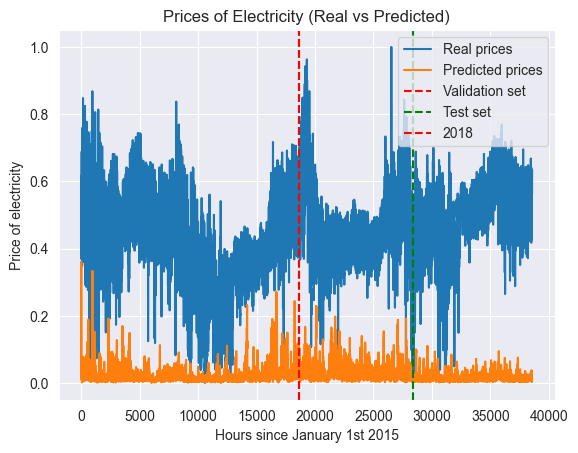

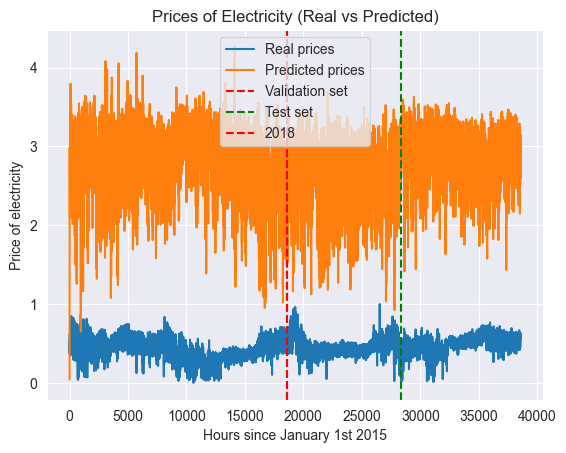

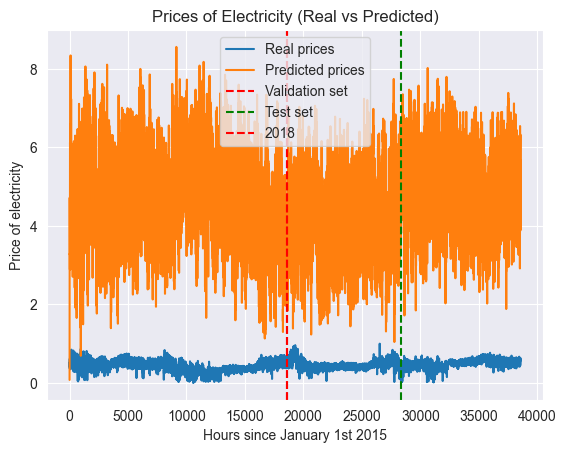

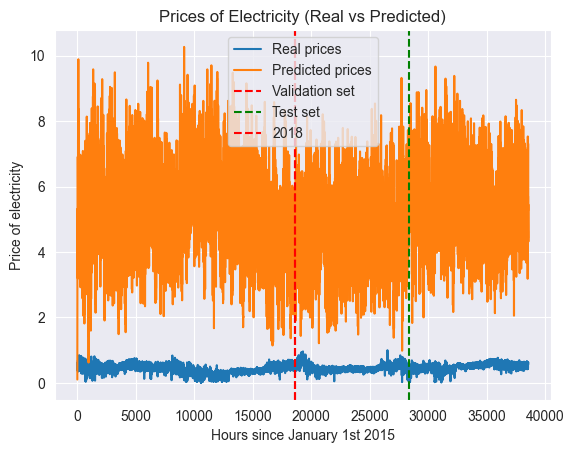

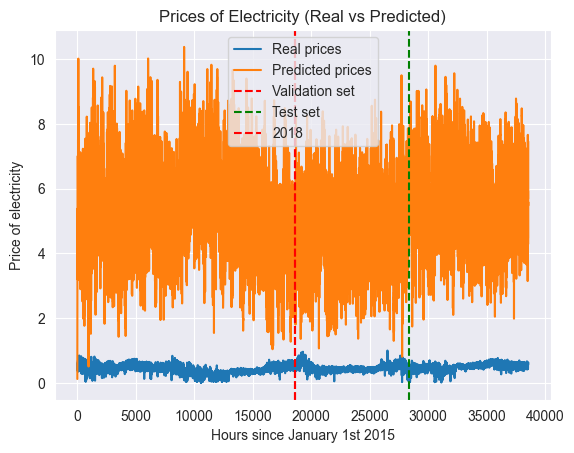

...

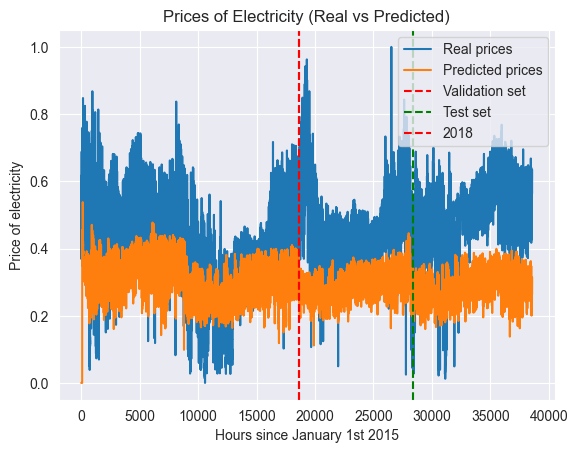

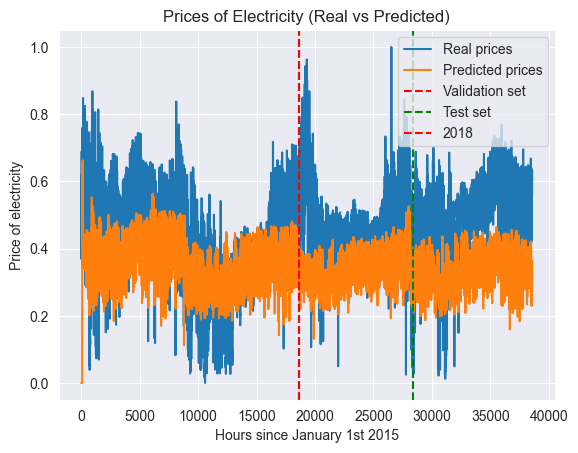

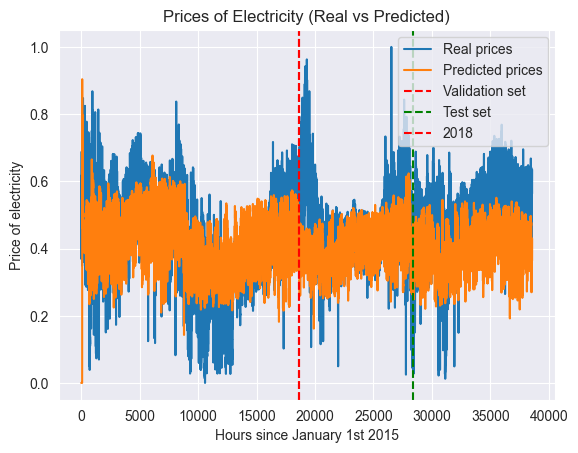

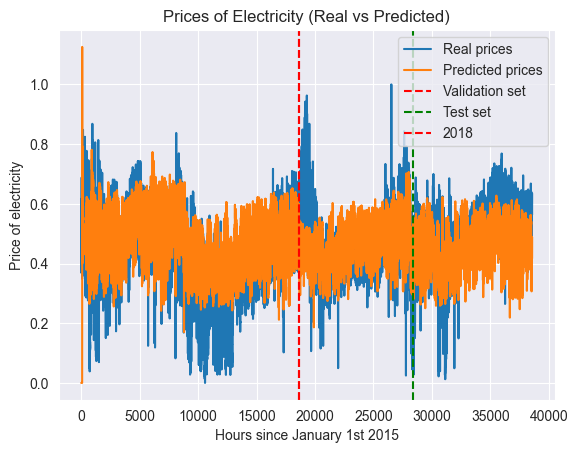

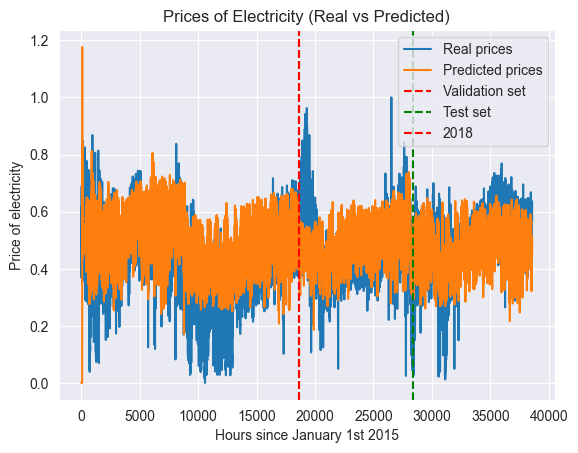

In [ ]:
util_type = "linear"

# Market parameters
num_goods = 2
num_buyers = 3

num_br_epochs = 100
num_episodes = 30
learn_rate_langmult = 1e-3
learn_rate_players = (1e-3, 1e-3)
learn_rate_br = 1e-4
beta_mult = 1.001
beta = 5.0
num_iters_players = 10
num_iters_langmult = 20
opt_name = "adam"

num_iters = (num_iters_players, num_iters_langmult)
learn_rates = (learn_rate_players, learn_rate_langmult, learn_rate_br)

(l_action, f_action, langmult), (data, figure_hist) = estimate_market_params(aggr_demand_hist, prices_hist, world_states, learn_rates, num_iters, beta_mult, beta, num_buyers, num_goods, num_episodes, num_br_epochs, util_type, opt_name)

In [ ]:
with imageio.get_writer('figures/electricity_price_prediction_animation.gif', mode='I') as writer:
    for fig in figure_hist:
        # Render the plot to a buffer
        canvas = fig.canvas
        canvas.draw()
        buf = canvas.buffer_rgba()
        image = imageio.core.util.Image(np.asarray(buf))
        writer.append_data(image)


# Append the last frame multiple times to create a pause at the end
for i in range(1000):
    writer.append_data(image)


In [ ]:
# Fit an ARIMA model to the time series data
model = sm.tsa.ARIMA(prices_train[:,0], world_states_train, (10, 10, 10))
results = model.fit()

/opt/homebrew/lib/python3.11/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/opt/homebrew/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
# Generate predictions for the next 10 time steps
forecast = results.forecast(exog = world_states, steps=  train_size -1 + val_size+ test_size)

Exception ignored in: <function LegacyWriter.__del__ at 0x1777bf740>
Traceback (most recent call last):
  File "/opt/homebrew/lib/python3.11/site-packages/imageio/v2.py", line 200, in __del__
    self.close()
  File "/opt/homebrew/lib/python3.11/site-packages/imageio/v2.py", line 190, in close
    self.instance.close()
  File "/opt/homebrew/lib/python3.11/site-packages/imageio/plugins/pillow.py", line 123, in close
    self._flush_writer()
  File "/opt/homebrew/lib/python3.11/site-packages/imageio/plugins/pillow.py", line 457, in _flush_writer
    primary_image.save(self._request.get_file(), **self.save_args)
  File "/opt/homebrew/lib/python3.11/site-packages/PIL/Image.py", line 2413, in save
    save_handler(self, fp, filename)
  File "/opt/homebrew/lib/python3.11/site-packages/PIL/GifImagePlugin.py", line 653, in _save_all
    _save(im, fp, filename, save_all=True)
  File "/opt/homebrew/lib/python3.11/site-packages/PIL/GifImagePlugin.py", line 664, in _save
    if not save_all or not

ARIMA mean squared error: 0.044596864365734915
GGS mean square error 0.02211281657218933


Text(0.05, 0.95, '    ARIMA MSE: 0.0446\n    GGS (Ours) MSE 0.0221')

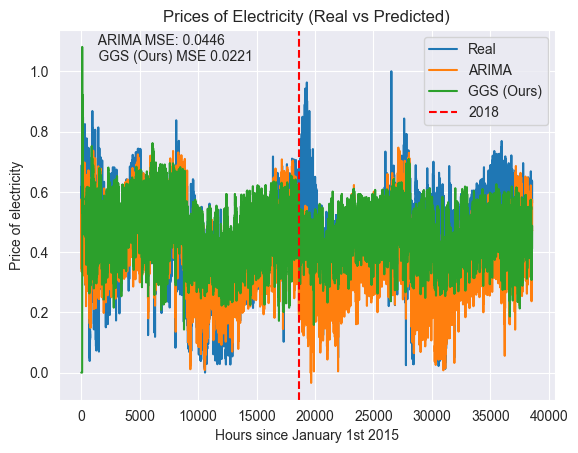

In [ ]:
dummy_state = {
            "supplies": jnp.array([1.0, 1.0]),
            "types": jnp.array([[2.0, 2.0], [3.0, 3.0], [2.0, 3.0]]),
            "budgets": jnp.array([10.0, 10.0, 10.0]),
    }

# Initialize market type
if util_type == "linear":
    utils = lambda X, T: jnp.sum(T * X, axis = 1).clip(1e-5)
elif util_type == "cd":
    utils = lambda X, T: jnp.prod(jnp.power(X, T), axis = 1).clip(1e-5)
elif util_type == "leontief":
    utils = lambda X, T: jnp.min(X / T, axis = 1).clip(1e-5)
else:
    raise ValueError("Invalid utility function!")

utils = jax.jit(utils)

br_network = hk.without_apply_rng(hk.transform(_br_network))
market_actor_network = hk.without_apply_rng(hk.transform(_market_actor_forward))

market = sf.StochasticFisher(utils, market_actor_network, br_network, world_states, seed)

shock_policy = lambda world_state: market_actor_network.apply(f_action, world_state, dummy_state)[0]
price_policy = lambda world_state, state: market_actor_network.apply(f_action, world_state, state)[1]
buyer_policy = lambda world_state, state: market_actor_network.apply(f_action, world_state, state)[2]

price_history = df_final_norm[['price actual']].values[1:]

traj = market.world_state_trajectory(shock_policy, price_policy, buyer_policy, train_size -1 + val_size+ test_size)


f_prices_hist = traj.a
f_alloc_hist = traj.b[0]
f_saving_hist = traj.b[1]

val_start = prices_train.shape[0]
test_start = prices_train.shape[0] + prices_val.shape[0]

mse_arima = np.mean((price_history[train_size + val_size:] - forecast[train_size + val_size:])**2)
mse_ggs = np.mean((price_history[train_size + val_size:] - f_prices_hist[:train_size + val_size:,0])**2)
print(f"ARIMA mean squared error: {mse_arima}")
print(f"GGS mean square error {mse_ggs}")

plt.plot(price_history, label='Real')
plt.plot(forecast, label='ARIMA')
plt.plot(f_prices_hist[:,0], label='GGS (Ours)')
plt.axvline(x=val_start, color='r', linestyle='--', label = "2018" )
plt.xlabel('Hours since January 1st 2015')
plt.ylabel('Price of electricity')
plt.title ('Prices of Electricity (Real vs Predicted)')
# plt.axvline(x=test_start, color='g', linestyle='--')
plt.legend()
plt.text(0.05, 0.95, f"    ARIMA MSE: {mse_arima:.04f}\n    GGS (Ours) MSE {mse_ggs:.04f}", horizontalalignment='left', verticalalignment='center', transform=plt.gca().transAxes)
